# Dog Breed classification with Deep Learning methods

- Configuration

In [1]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
# system libraries
import warnings
warnings.filterwarnings("ignore")
from time import time
import gc
# data structure libraries
import numpy as np
import pandas as pd
# data visualisation libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage.transform import resize
from IPython.display import SVG
import seaborn as sns
import os, shutil, tarfile, requests
from tensorboard import notebook
import math
import PIL
import matplotlib as mpl
# deep learning libraries
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.data import experimental
from tensorflow.keras.utils import plot_model, model_to_dot

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [3]:
def plot_history(history, epochs) :
    """
    function to plot the history of the tensorflow fit
    parameters : history 
                 epochs : int : n epochs in the history
    """
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    #plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    #plt.ylim([0,1.0])
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [4]:
def split_test_val(ds, prct=0.2) :
    """
    function to split a tensorflow dataset into 2
    """
    n = int(np.ceil(1/prct))
    print(n)
    val_batches = tf.data.experimental.cardinality(ds)
    test_ds = ds.take(val_batches // n)
    val_ds = ds.skip(val_batches // n)
    return val_ds, test_ds

In [5]:
%%time
import os, shutil, tarfile, requests
from tensorboard import notebook
import math
import matplotlib as mpl
# deep learning libraries
%tensorflow_version 2.x
import tensorflow as tf
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

VM_ROOT_DIR = '/content'
PROJECT_ROOT_DIR = '/content/gdrive/MyDrive/Projet6'
DATA_PATH = os.path.join(VM_ROOT_DIR, "data")
os.makedirs(DATA_PATH, exist_ok=True)
url = 'http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar'
if url.find('/'):
  fname = url.rsplit('/', 1)[1]

r = requests.get(url, allow_redirects=True)
open(fname, 'wb').write(r.content)
print("...Archive downloaded...")


src = os.path.join(VM_ROOT_DIR, fname)
dest = os.path.join(DATA_PATH, fname)
shutil.move(src, dest)

with tarfile.open(dest, 'r') as f:
  f.extractall(DATA_PATH)

print("...Archive extracted...")

IMAGES_PATH = os.path.join(DATA_PATH, "Images")

img_width, img_height = 224, 224
channels = 3
batch_size = 32
image_arr_size= img_width * img_height * channels

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
...Archive downloaded...
...Archive extracted...
CPU times: user 7.16 s, sys: 8.61 s, total: 15.8 s
Wall time: 28.6 s


In [6]:
n_class = 20 # nombre de races de chiens conservées pour le développement
IDIR = '/content/data/Images'
from google.colab import drive
drive.mount('/content/drive')
DIR = "/data"
list_class = os.listdir(IDIR)[:n_class]
print("Races de chiens :")
print(list_class)


Mounted at /content/drive
Races de chiens :
['n02105056-groenendael', 'n02106550-Rottweiler', 'n02108000-EntleBucher', 'n02094114-Norfolk_terrier', 'n02089078-black-and-tan_coonhound', 'n02086910-papillon', 'n02109525-Saint_Bernard', 'n02102040-English_springer', 'n02113712-miniature_poodle', 'n02110958-pug', 'n02106662-German_shepherd', 'n02113624-toy_poodle', 'n02093428-American_Staffordshire_terrier', 'n02113186-Cardigan', 'n02098413-Lhasa', 'n02088094-Afghan_hound', 'n02097298-Scotch_terrier', 'n02106030-collie', 'n02087394-Rhodesian_ridgeback', 'n02095314-wire-haired_fox_terrier']


In [8]:
#shutil.rmtree(DIR+"/Images/Images/") # Suppression du repertoire DIR+"/Images/Imges/" s'il existe déja
for class_name in list_class :
  shutil.copytree(IDIR+"/"+class_name, DIR+"/Images/Images/"+class_name, symlinks=False, ignore=None)

In [11]:
# Creating a train set
train_set = image_dataset_from_directory(
    DIR+"/Images/Images",
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3402 files belonging to 20 classes.
Using 2722 files for training.


In [12]:
# Creating a validation set
val_set = image_dataset_from_directory(
    DIR+"/Images/Images",
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3402 files belonging to 20 classes.
Using 680 files for validation.


In [13]:
val_set_ds, val_test=split_test_val(val_set,0.2)

5


In [14]:
# Displaying names of breed
class_names = train_set.class_names
print(class_names)

['n02086910-papillon', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02089078-black-and-tan_coonhound', 'n02093428-American_Staffordshire_terrier', 'n02094114-Norfolk_terrier', 'n02095314-wire-haired_fox_terrier', 'n02097298-Scotch_terrier', 'n02098413-Lhasa', 'n02102040-English_springer', 'n02105056-groenendael', 'n02106030-collie', 'n02106550-Rottweiler', 'n02106662-German_shepherd', 'n02108000-EntleBucher', 'n02109525-Saint_Bernard', 'n02110958-pug', 'n02113186-Cardigan', 'n02113624-toy_poodle', 'n02113712-miniature_poodle']


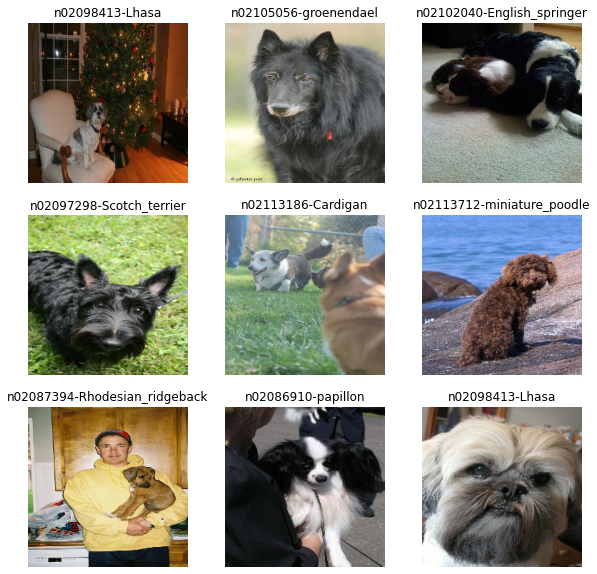

In [15]:
# Displaying some pictures of train set
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [16]:
for image_batch, labels_batch in train_set:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 224, 3)
(32,)


Deux jeux de données ont été créés avec nos sept races. L'ensemble de données d'entraînement contient 80 % des données et l'ensemble de données de validation contient 20 %.

## 2-Convnet modelisation

Une fois les jeux de données créés, nous créons notre premier CNN.

---

In [17]:
num_classes = 20
img_width, img_height = 224, 224
channels = 3
batch_size = 32
# Architecture of our CNN
model = keras.Sequential()
model.add(keras.Input(shape=(img_height, img_width, channels)))
model.add(layers.Rescaling(1./255))
model.add(layers.Conv2D(128, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation="softmax"))

model.compile(
  optimizer='adam', 
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 128)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      73792     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        1

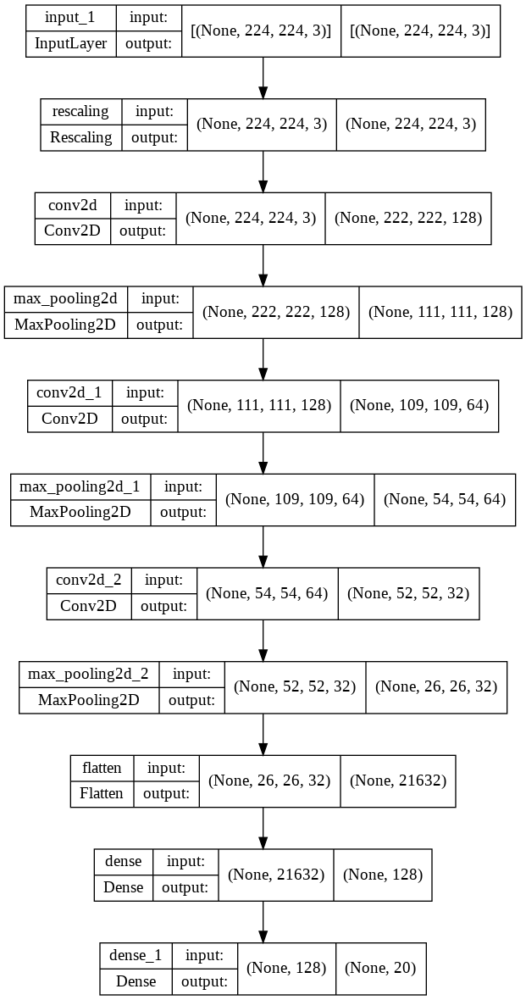

In [19]:
# Displaying model
plot_model(model, show_shapes=True, show_layer_names=True)

Notre modèle contient une couche de mise à l'échelle. Cette couche est là pour transformer la valeur du pixel en une valeur entre [0, 1]. Trois couches convolutionnelles et trois couches de regroupement sont présentées afin de sélectionner les informations pertinentes dans chaque image. Enfin, des couches aplaties et entièrement connectées sont utilisées afin de transformer le résultat en une prédiction. Cette prédiction est une probabilité d'appartenir à une classe.


In [ ]:
t0 = time()
epochs = 20 
# training model + time measure
history = model.fit(train_set,  
validation_data=val_set_ds,epochs=epochs,
)
print("Done in %0.03fs." % (time() - t0))

Epoch 1/20
35/86 [===========>..................] - ETA: 6:19 - loss: 3.0066 - accuracy: 0.0545

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_test)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

4/4 [==============================] - 1s 92ms/step - loss: 12.5179 - accuracy: 0.1484
initial loss: 12.52
initial accuracy: 0.15


In [ ]:
model.predict(val_test.take(1))

array([[2.40109671e-06, 1.17620039e-06, 2.04966182e-06, 1.42089173e-01,
        1.24235577e-09, 1.91836298e-05, 1.48558360e-10, 2.19572859e-04,
        8.50276589e-01, 1.07936323e-07, 8.69808719e-05, 6.42630598e-03,
        1.57691378e-04, 4.58117720e-04, 8.22939683e-07, 1.28196564e-06,
        7.69736380e-06, 8.57908162e-06, 2.45452466e-05, 2.17796827e-04],
       [3.26125127e-10, 2.33374749e-06, 1.73711840e-07, 2.27996036e-02,
        1.00866368e-03, 1.21409120e-02, 3.84770341e-13, 9.54096019e-01,
        6.72380193e-05, 2.29262355e-06, 3.63727470e-09, 1.03486658e-04,
        2.81267508e-04, 2.28737781e-06, 8.32093769e-11, 3.31100267e-07,
        2.63376697e-03, 3.07342169e-08, 1.33359421e-07, 6.86139101e-03],
       [9.99742806e-01, 7.03123393e-10, 1.99341807e-10, 1.19978036e-08,
        1.78929458e-08, 5.67925811e-11, 7.83440500e-12, 7.71650105e-13,
        1.69949362e-05, 1.96908006e-12, 3.84478360e-09, 1.34790304e-11,
        1.21044457e-06, 2.93824905e-05, 2.08396072e-04, 2.1292

In [ ]:
for i in val_test.take(1):
  print(i)
#val_test.take(1)

(<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
array([[[[ 91.091835,  89.091835,  92.091835],
         [ 85.80612 ,  84.80612 ,  81.908165],
         [ 80.54082 ,  79.54082 ,  74.54082 ],
         ...,
         [ 61.816338,  58.816338,  51.816338],
         [ 65.06124 ,  62.061245,  55.061245],
         [ 66.63261 ,  63.632603,  56.632603]],

        [[ 95.45918 ,  93.45918 ,  95.13265 ],
         [ 93.63265 ,  92.63265 ,  89.061226],
         [ 94.418365,  93.418365,  88.418365],
         ...,
         [ 71.30615 ,  68.30615 ,  61.306152],
         [ 66.061195,  63.06119 ,  56.06119 ],
         [ 66.25526 ,  63.255257,  56.255257]],

        [[ 91.96939 ,  89.96939 ,  90.96939 ],
         [ 99.54082 ,  98.54082 ,  93.92857 ],
         [ 82.77551 ,  82.72449 ,  74.877556],
         ...,
         [ 84.122215,  81.122215,  74.122215],
         [ 70.05103 ,  67.05103 ,  60.051037],
         [ 70.224365,  67.224365,  60.224365]],

        ...,

        [[ 81.82654 ,  76.82654 

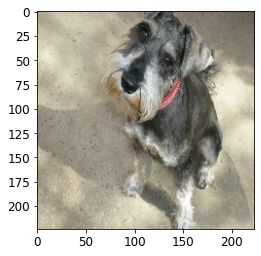

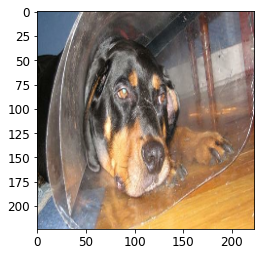

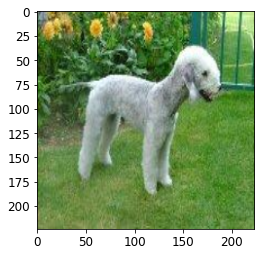

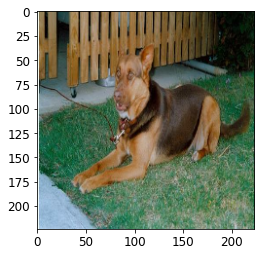

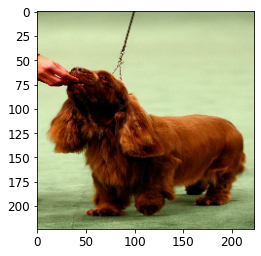

...

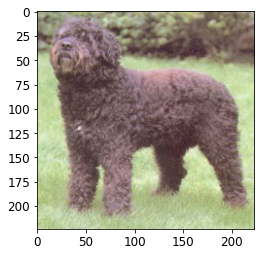

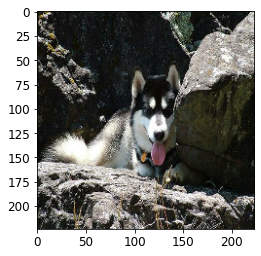

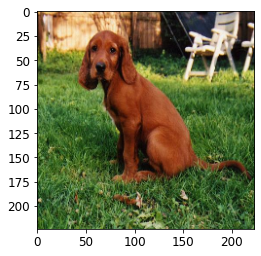

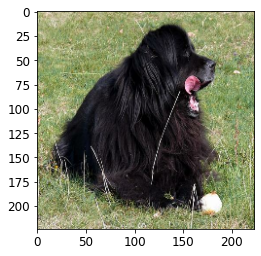

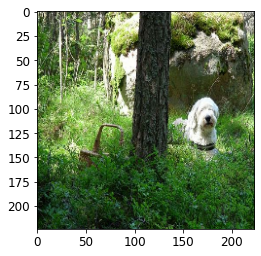

In [ ]:
for i in val_test.take(1):
  for j in i[0].numpy():
    plt.imshow(j/255.0)
    plt.show()

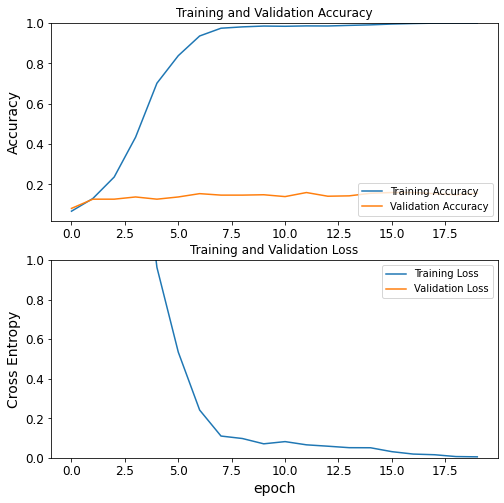

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

On remarque une très bonne précision sur le jeu d'apprentissage alors que la précision sur le jeu de validation reste très faible. Cela est caractéristique d'un sur-apprentissage.

###Corriger le surapprentissage

**Augmentation de données**

Cette technique est utile lorsque l'on a une petite base de données qui peut facilement provoquer un sur apprentissage : le modèle est assez complexe pour s'adapter facilement aux images d'apprentissage (en apprenant du bruit par exemple) au détriment de la précision sur le jeu de validation.
Pour lutter contre ce phénomène il est possible d'appliquer des opérations géométriques (rotation, zoom, ...) pour augmenter artificiellement le nombre d'images.

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal_and_vertical",
                      input_shape=((img_height, img_width, channels))),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_set.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

In [ ]:
num_classes = 20
# Architecture of our CNN
model = keras.Sequential()
model.add(data_augmentation)
#model.add(keras.Input(shape=(img_height, img_width, channels)))
model.add(layers.Conv2D(128, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation="softmax"))

model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
model.summary()

In [ ]:
t0 = time()

epochs = 20

# training model+ time measurement

history = model.fit_generator(
  train_generator,
  steps_per_epoch = train_generator.samples // batch_size,
  validation_data = validation_generator, 
  validation_steps = validation_generator.samples // batch_size,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

In [ ]:
plot_history(history,20)

25586

# Trial with seven breeds - Preprocessing of images + Convnet

## **1-Image Preprocessing**

Avant de modéliser et d'utiliser un nouveau CNN, les données seront prétraitées. Certaines méthodes seront utilisées. Parmi eux, le blanchiment ou la rotation seront tentés. Cette étape a deux objectifs : 
- Better performance with CNN structure ; 
- Data Augmentation. 

In [ ]:
# create generator with whitening and rotation

data_gen = ImageDataGenerator(rescale=1./255,
                             zca_whitening=True,
                             horizontal_flip=True,
                             vertical_flip=True,
                             validation_split=0.2,
                             dtype=tf.float32)

In [ ]:
# transform & create train set
path=DIR+"/Images/Images"
train_generator = data_gen.flow_from_directory(
    path,
    subset="training",
    seed=42,
    class_mode='sparse',
    target_size=(img_height, img_width), 
    color_mode='rgb',
    batch_size=batch_size)

Found 2825 images belonging to 20 classes.


In [ ]:
# transform & create validation set

validation_generator = data_gen.flow_from_directory(
    path,
    subset="validation",
    seed=42,
    class_mode='sparse',
    target_size=(img_height, img_width), 
    color_mode='rgb',
    batch_size=batch_size)

Found 699 images belonging to 20 classes.


##**2-Convnet modelisation**

L'architecture de notre CNN est la même que celle du premier essai. Les données d'entrée sont différentes en raison du prétraitement et de l'augmentation des données.

In [ ]:
num_classes = 20
# Architecture of our CNN
model = keras.Sequential()
model.add(keras.Input(shape=(img_height, img_width, channels)))
model.add(layers.Conv2D(128, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(64, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Conv2D(32, 3, activation='relu'))
model.add(layers.MaxPooling2D())
model.add(layers.Flatten())
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dense(num_classes, activation="softmax"))

model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
t0 = time()

epochs = 20

# training model+ time measurement

history = model.fit_generator(
  train_generator,
  steps_per_epoch = train_generator.samples // batch_size,
  validation_data = validation_generator, 
  validation_steps = validation_generator.samples // batch_size,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
84/84 [==============================] - 28s 196ms/step - loss: 2.9480 - accuracy: 0.0832 - val_loss: 2.8197 - val_accuracy: 0.1328
Epoch 2/20
84/84 [==============================] - 15s 181ms/step - loss: 2.7591 - accuracy: 0.1288 - val_loss: 2.7092 - val_accuracy: 0.1609
Epoch 3/20
84/84 [==============================] - 15s 181ms/step - loss: 2.6435 - accuracy: 0.1590 - val_loss: 2.6687 - val_accuracy: 0.1641
Epoch 4/20
84/84 [==============================] - 15s 181ms/step - loss: 2.5521 - accuracy: 0.2042 - val_loss: 2.6173 - val_accuracy: 0.1844
Epoch 5/20
84/84 [==============================] - 15s 180ms/step - loss: 2.4290 - accuracy: 0.2475 - val_loss: 2.5998 - val_accuracy: 0.1813
Epoch 6/20
84/84 [==============================] - 15s 181ms/step - loss: 2.3085 - accuracy: 0.2878 - val_loss: 2.6600 - val_accuracy: 0.2000
Epoch 7/20
84/84 [==============================] - 15s 181ms/step - loss: 2.1877 - accuracy: 0.3277 - val_loss: 2.6412 - val_accuracy: 0.1969

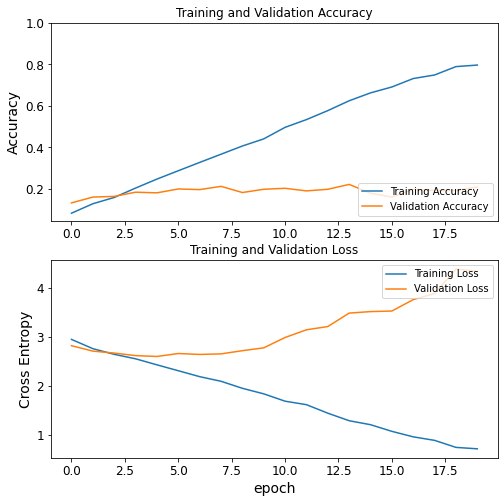

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([min(plt.ylim()),max(plt.ylim())])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Les performances sont nettement meilleures et le temps consacré à l'entraînement est moins important. Cependant, certains modèles pré-formés peuvent nous aider à avoir de meilleures performances. Dans une deuxième approche, nous utiliserons des méthodes d'apprentissage par transfert.

## 3) Transfer Learning with ResNet

Comme vu précédemment, le prétraitement et la préparation des données améliorent la précision de nos modèles.

##1-Data Preparation

In [ ]:
# Creating train set

train_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3378 files belonging to 20 classes.
Using 2703 files for training.


In [ ]:
# Creating validation set

val_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

Found 3378 files belonging to 20 classes.
Using 675 files for validation.


In [ ]:
# Creating test set
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [ ]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 15
Number of test batches: 3


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.prefetch(buffer_size=AUTOTUNE)
val_set = val_set.prefetch(buffer_size=AUTOTUNE)
test_set = test_set.prefetch(buffer_size=AUTOTUNE)

In [ ]:
# data augmentation layer

data_augmentation = tf.keras.Sequential([
  layers.RandomFlip('horizontal_and_vertical', seed=42),
  layers.RandomRotation(0.2)
])

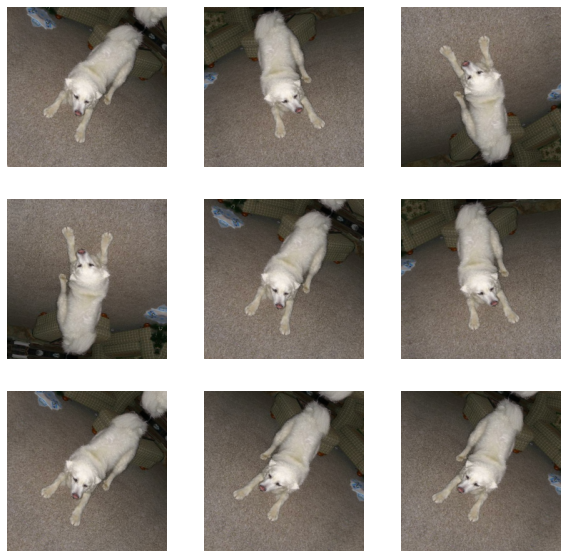

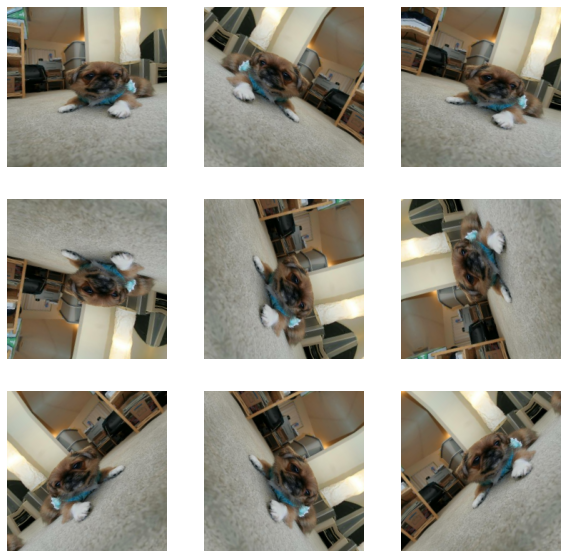

In [ ]:
for image, _ in train_set.take(2):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

## 2-Transfer Learning with VGG19

### Implementation

First pre-trained model is VGG19. It is a variant of VGG16, which contains 19 layers. 

In [ ]:
img_shape = img_height, img_width, channels

In [ ]:
num_classes = 20

In [ ]:
preprocess_input = keras.applications.vgg19.preprocess_input
rescale = layers.Rescaling(1./255, offset=-1)

In [ ]:
base_model = keras.applications.vgg19.VGG19(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

80150528/80134624 [==============================] - 0s 0us/step


In [ ]:
mage_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

NameError: ignored

In [ ]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [ ]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 20)


In [ ]:
# Freezing 11 layers and training 8
for layer in base_model.layers[:8]:
  base_model.trainable = False

In [ ]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

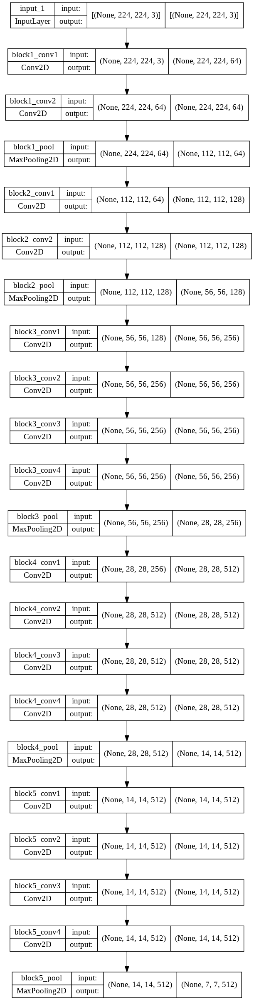

In [ ]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
# Architecture of VGG19 with input layers, data augmentation and preprocessing layers

inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 224, 224, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 224, 224, 3)      0         
                                                                 
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                      

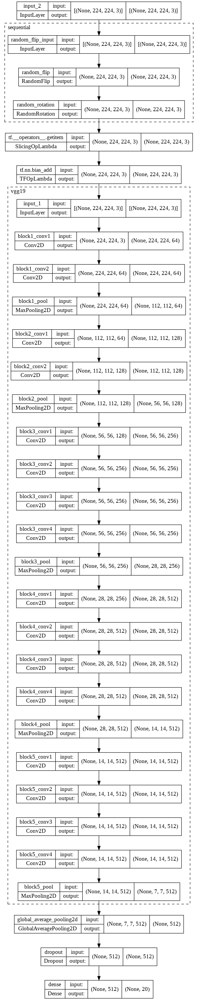

In [ ]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
85/85 [==============================] - 24s 260ms/step - loss: 6.5875 - accuracy: 0.1820 - val_loss: 2.5492 - val_accuracy: 0.5265
Epoch 2/20
85/85 [==============================] - 21s 239ms/step - loss: 3.4053 - accuracy: 0.3903 - val_loss: 1.3033 - val_accuracy: 0.7166
Epoch 3/20
85/85 [==============================] - 21s 245ms/step - loss: 2.5059 - accuracy: 0.4887 - val_loss: 1.0390 - val_accuracy: 0.7898
Epoch 4/20
85/85 [==============================] - 22s 253ms/step - loss: 2.0288 - accuracy: 0.5694 - val_loss: 0.8790 - val_accuracy: 0.8172
Epoch 5/20
85/85 [==============================] - 21s 249ms/step - loss: 1.8480 - accuracy: 0.6004 - val_loss: 0.8088 - val_accuracy: 0.8318
Epoch 6/20
85/85 [==============================] - 21s 243ms/step - loss: 1.6622 - accuracy: 0.6367 - val_loss: 0.7535 - val_accuracy: 0.8300
Epoch 7/20
85/85 [==============================] - 22s 253ms/step - loss: 1.4685 - accuracy: 0.6630 - val_loss: 0.6702 - val_accuracy: 0.8446

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

18/18 [==============================] - 4s 182ms/step - loss: 0.5894 - accuracy: 0.8757
initial loss: 0.59
initial accuracy: 0.88


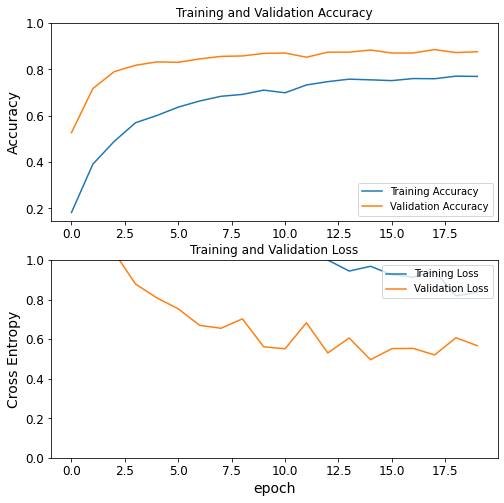

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

Performances are better with VGG19 than CNN from scratch and training time are less important. Second step is fine-tuning of our model.

### Fine-tuning

In [ ]:
base_model.trainable = True

In [ ]:
# Fine-tune from this layer onwards
fine_tune_at = 5

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
85/85 [==============================] - 21s 242ms/step - loss: 0.8164 - accuracy: 0.7717 - val_loss: 0.5434 - val_accuracy: 0.8903
Epoch 21/40
85/85 [==============================] - 22s 253ms/step - loss: 0.7969 - accuracy: 0.7814 - val_loss: 0.4675 - val_accuracy: 0.8867
Epoch 22/40
85/85 [==============================] - 22s 250ms/step - loss: 0.7363 - accuracy: 0.7869 - val_loss: 0.5607 - val_accuracy: 0.8647
Epoch 23/40
85/85 [==============================] - 21s 243ms/step - loss: 0.7620 - accuracy: 0.7847 - val_loss: 0.5134 - val_accuracy: 0.8921
Epoch 24/40
85/85 [==============================] - 22s 252ms/step - loss: 0.7972 - accuracy: 0.7736 - val_loss: 0.5955 - val_accuracy: 0.8702
Epoch 25/40
85/85 [==============================] - 22s 248ms/step - loss: 0.7540 - accuracy: 0.7939 - val_loss: 0.5479 - val_accuracy: 0.8976
Epoch 26/40
85/85 [==============================] - 22s 254ms/step - loss: 0.6897 - accuracy: 0.8013 - val_loss: 0.5980 - val_accuracy:

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

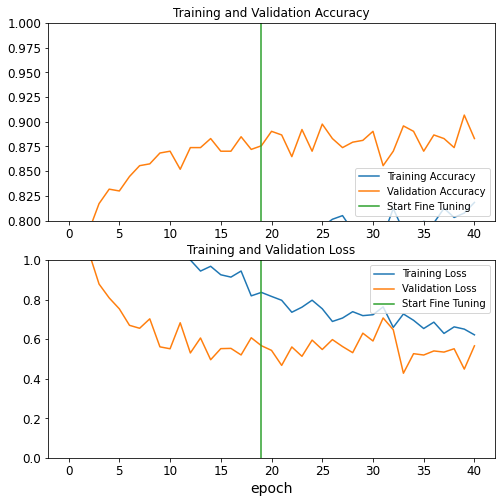

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

4/4 [==============================] - 1s 186ms/step - loss: 0.5657 - accuracy: 0.8672
Test accuracy : 0.8671875


In [ ]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy
del rescale
del test_set

gc.collect()

43064

## 3) Transfer Learning with ResNet

### Implementation

Second architecture is ResNet50. This model is more impressive than VGG19. It counts 150 layers.

In [ ]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.resnet_v2.preprocess_input
base_model = keras.applications.resnet_v2.ResNet50V2(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

94683136/94668760 [==============================] - 2s 0us/step


In [ ]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [ ]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [ ]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

Number of validation batches: 18
Number of test batches: 4


In [ ]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


In [ ]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 20)


In [ ]:
for layer in base_model.layers[:8]:
  base_model.trainable = False

In [ ]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

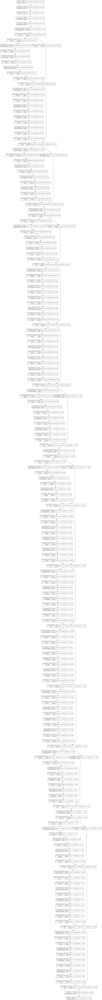

In [ ]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
x = layers.Flatten()(x) 
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0   

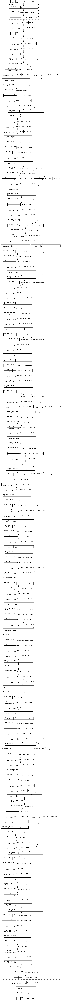

In [ ]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
plot_model(model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)


print("Done in %0.3fs." % (time() - t0))

Epoch 1/20
85/85 [==============================] - 16s 143ms/step - loss: 3.3769 - accuracy: 0.2268 - val_loss: 0.7174 - val_accuracy: 0.7716
Epoch 2/20
85/85 [==============================] - 11s 120ms/step - loss: 1.9281 - accuracy: 0.4869 - val_loss: 0.4969 - val_accuracy: 0.8448
Epoch 3/20
85/85 [==============================] - 11s 121ms/step - loss: 1.5394 - accuracy: 0.5819 - val_loss: 0.3409 - val_accuracy: 0.9047
Epoch 4/20
85/85 [==============================] - 11s 122ms/step - loss: 1.3628 - accuracy: 0.6289 - val_loss: 0.3578 - val_accuracy: 0.9002
Epoch 5/20
85/85 [==============================] - 11s 123ms/step - loss: 1.2618 - accuracy: 0.6415 - val_loss: 0.3112 - val_accuracy: 0.9157
Epoch 6/20
85/85 [==============================] - 11s 122ms/step - loss: 1.2180 - accuracy: 0.6670 - val_loss: 0.3221 - val_accuracy: 0.9268
Epoch 7/20
85/85 [==============================] - 11s 120ms/step - loss: 1.1243 - accuracy: 0.6855 - val_loss: 0.3249 - val_accuracy: 0.9113

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

15/15 [==============================] - 2s 86ms/step - loss: 0.2815 - accuracy: 0.9113
initial loss: 0.28
initial accuracy: 0.91


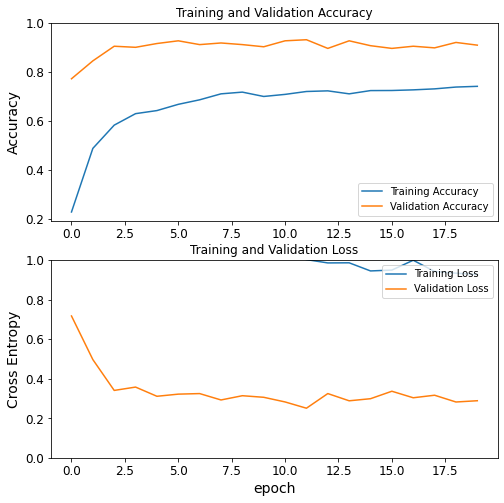

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Fine-tuning

In [ ]:
base_model.trainable = True

In [ ]:
# Fine-tune from this layer onwards
fine_tune_at = 5

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)


print("Done in %0.3fs." % (time() - t0))

Epoch 20/40
85/85 [==============================] - 10s 117ms/step - loss: 0.9370 - accuracy: 0.7347 - val_loss: 0.3280 - val_accuracy: 0.9024
Epoch 21/40
85/85 [==============================] - 10s 117ms/step - loss: 0.9147 - accuracy: 0.7381 - val_loss: 0.3128 - val_accuracy: 0.9069
Epoch 22/40
85/85 [==============================] - 11s 120ms/step - loss: 0.9259 - accuracy: 0.7299 - val_loss: 0.2746 - val_accuracy: 0.9246
Epoch 23/40
85/85 [==============================] - 11s 120ms/step - loss: 0.8390 - accuracy: 0.7603 - val_loss: 0.2692 - val_accuracy: 0.9290
Epoch 24/40
85/85 [==============================] - 11s 122ms/step - loss: 0.9243 - accuracy: 0.7418 - val_loss: 0.3339 - val_accuracy: 0.9047
Epoch 25/40
85/85 [==============================] - 11s 121ms/step - loss: 0.8752 - accuracy: 0.7543 - val_loss: 0.2772 - val_accuracy: 0.9180
Epoch 26/40
85/85 [==============================] - 10s 119ms/step - loss: 0.9391 - accuracy: 0.7377 - val_loss: 0.3252 - val_accuracy:

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

In [ ]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy

gc.collect()

## 4) Inception V3

Third model is Inception V3. It is a model with more than 300 layers. We can expect best performance for this model. 

### Implementation

In [ ]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.inception_v3.preprocess_input
base_model = keras.applications.inception_v3.InceptionV3(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

NameError: ignored

In [ ]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [ ]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [ ]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

In [ ]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

In [ ]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

In [ ]:
for layer in base_model.layers[:10]:
  base_model.trainable = False

In [ ]:
base_model.summary()

In [ ]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

In [ ]:
cc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Fine-tuning

In [ ]:
base_model.trainable = True

In [ ]:
# Fine-tune from this layer onwards
fine_tune_at = 10

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

In [ ]:
del model
del base_model
del history
del loss0, accuracy0
del accuracy

gc.collect()

## 5) Transfer Learning with EfficientNet

### Implementation

In [ ]:
rescale = layers.Rescaling(1./255, offset=-1)
preprocess_input = keras.applications.efficientnet.preprocess_input
base_model = keras.applications.efficientnet.EfficientNetB7(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [ ]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)

In [ ]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [ ]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

In [ ]:
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

In [ ]:
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

In [ ]:
for layer in base_model.layers[:10]:
  base_model.trainable = False

In [ ]:
base_model.summary()

In [ ]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

In [ ]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)

print("Done in %0.3fs." % (time() - t0))

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### Fine-tuning

In [ ]:
base_model.trainable = True

In [ ]:
# Fine-tune from this layer onwards
fine_tune_at = 10

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)


print("Done in %0.3fs." % (time() - t0))

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_set)
print('Test accuracy :', accuracy)

# Generalization with 120 breeds

### 1) Data augmentation & preprocessing

In [ ]:
path = IMAGES_PATH
img_width, img_height = 224, 224
channels = 3
batch_size = 32
image_arr_size= img_width * img_height * channels

In [ ]:
# Creating a train set
train_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

In [ ]:
# Creating a validation set
val_set = image_dataset_from_directory(
    path,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size)

In [ ]:
# Displaying names of breed
class_names = val_set.class_names
print(class_names)

In [ ]:
# Displaying some pictures of train set
plt.figure(figsize=(10, 10))
for images, labels in train_set.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
val_batches = experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

In [ ]:
print('Number of validation batches: %d' % experimental.cardinality(val_set))
print('Number of test batches: %d' % experimental.cardinality(test_set))

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_set = train_set.prefetch(buffer_size=AUTOTUNE)
val_set = val_set.prefetch(buffer_size=AUTOTUNE)
test_set = test_set.prefetch(buffer_size=AUTOTUNE)

In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip('horizontal_and_vertical', seed=42),
  layers.RandomRotation(0.2, seed=42),
  layers.RandomContrast(0.7, seed=42),
  layers.RandomTranslation(height_factor=(-0.2, 0.3),
                           width_factor=(-0.2, 0.3),
                           fill_mode='reflect', seed=42)
])

In [ ]:
for image, _ in train_set.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

### 2) Modelisation with Inception V3

#### Model configuration & training

In [ ]:
img_shape = img_height, img_width, channels
num_classes = 120

In [ ]:
rescale = layers.Rescaling(1./255, offset=-1)

In [ ]:
preprocess_input = keras.applications.inception_v3.preprocess_input
base_model = keras.applications.inception_v3.InceptionV3(
    weights="imagenet",
    input_shape= img_shape,
    include_top=False)

In [ ]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)
global_average_layer = layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

In [ ]:
num_classes=120
prediction_layer = layers.Dense(num_classes, activation="softmax")
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

In [ ]:
for layer in base_model.layers[:15]:
  base_model.trainable = False

In [ ]:
base_model.summary()

In [ ]:
SVG(model_to_dot(base_model).create(prog='dot', format='svg'))
plot_model(base_model, show_shapes=True, show_layer_names=True, expand_nested=True)

- Model compilation

In [ ]:
inputs = tf.keras.Input(shape=(img_height, img_width, channels))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.7)(x)
x = layers.Flatten()(x)
outputs = prediction_layer(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(
  optimizer='adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
t0 = time()

epochs = 20

history = model.fit(
  train_set,
  validation_data=val_set,
  epochs=epochs)


print("Done in %0.3fs." % (time() - t0))

In [ ]:
initial_epochs = 20

loss0, accuracy0 = model.evaluate(val_set)
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

#### Accuracy and loss

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### 3) Fine-tuning

In [ ]:
base_model.trainable = True

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 25

# Freeze all the layers before the 'fine_tune_at' layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable =  False

In [ ]:
fine_tune_epochs = 20
total_epochs =  initial_epochs + fine_tune_epochs

t0 = time()

history_fine = model.fit(train_set,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_set)

print("Done in %0.3fs." % (time() - t0))

In [ ]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

In [ ]:
plt.figure(figsize=(12, 12))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.5, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 3.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [ ]:
loss, accuracy = model.evaluate(test_set)

#### Evaluation performance

In [ ]:
print('Test accuracy :', round(accuracy, 3))

In [ ]:
preds = model.predict(test_set, verbose = 1)

In [ ]:
pred_labels = tf.argmax(preds, axis=1)

In [ ]:
test_labels = np.concatenate([y for x, y in test_set], axis=0)

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(test_labels, pred_labels, output_dict=True)

In [ ]:
f1scores = {}
for k,v in report.items():
    if k == 'accuracy':
        break
    else:
        f1scores[class_names[int(k)]] = v['f1-score']

In [ ]:
F1 = pd.DataFrame({"Classes":list(f1scores.keys()),
                   "F1-Scores":list(f1scores.values())}).sort_values("F1-Scores", ascending=False)

In [ ]:
fig, ax = plt.subplots(figsize = (15,20))
plt.barh(F1["Classes"], F1["F1-Scores"])
plt.ylim(-1,101)
plt.xlabel("F1-Scores")
plt.ylabel("Dog Breeds")
plt.title("F1-Scores across various Dog Breeds")
plt.gca().invert_yaxis()
for i, v in enumerate(round(F1["F1-Scores"],3)):
    ax.text(v, i + .25, str(v), color='red')

#### Saving Model

In [ ]:
model.save("/content/drive/My Drive/P6/my_model.h5")

### 4) New prediction with new data

In [ ]:
with open("/content/drive/My Drive/P6/dogs_name.txt", "w") as output:
    output.write(str(class_names))

In [ ]:
from tensorflow.keras.utils import load_img, img_to_array

path_test = "/content/drive/My Drive/Ingénieur ML - OC/P6/test.jpg"
test = load_img(path_test)

plt.axis("off")
plt.imshow(test)

In [ ]:
import cv2

img_test = img_to_array(test)
img_test = cv2.resize(img_test,(224,224))
img_test = img_test.reshape(1,224,224,3)
predictions = model.predict(img_test)
pred = tf.nn.softmax(predictions[0])
print("This image belongs to {}.".format(class_names[np.argmax(pred)])) 

# Ressources

*Image preprocessing*
- https://hadrienj.github.io/posts/Preprocessing-for-deep-learning/
- https://www.kaggle.com/nicw102168/exploring-zca-and-color-image-whitening

*Utilis.*
- https://www.tensorflow.org/tutorials/load_data/images

*Deep Learning Modelisation, CNN & Transfer Learning*
- https://www.tensorflow.org/tutorials/images/classification
- https://www.tensorflow.org/tutorials/images/transfer_learning
- https://keras.io/guides/transfer_learning/
- *Deep Learning with TensorFlow*, 2nd Edition, François Chollet
- https://arxiv.org/abs/1512.00567v3
